In [3]:
import sklearn
import numpy as np
import scipy as sp
import pandas as pd
%matplotlib notebook
%matplotlib widget
import matplotlib.pyplot as plt
import seaborn as sns

In [7]:

qsar = pd.read_excel('QSAR_dataset.xlsx')
print(qsar.shape)

(154, 76)


In [16]:
qsar.describe()
data =qsar
data.describe()

,apol,ASA+,ASA-,a_count,a_donacc,a_heavy,a_hyd,a_IC,a_nC,a_nCl,...,VSA,vsa_acc,vsa_hyd,vsa_pol,vsurf_A,vsurf_R,vsurf_S,vsurf_V,Weight,zagreb
count,154.000000,152.000000,153.000000,154.000000,154.000000,153.000000,154.000000,153.000000,154.000000,154.000000,...,154.000000,154.000000,154.000000,154.000000,154.000000,1.470000e+02,141.000000,136.000000,154.000000,154.000000
mean,34.610698,105.781739,359.928668,23.909091,0.292208,18.875817,17.350649,33.912102,11.649351,3.110390,...,273.307303,8.076532,239.944812,9.086768,2.379611,-6.802721e+08,-66.497364,-2.501405,359.813016,101.350649
std,5.951534,62.391286,111.225998,4.895461,0.862625,5.596428,5.028718,9.714722,2.472152,2.954031,...,52.783753,14.721655,59.915749,15.129738,2.637952,8.247861e+09,73.647379,2.807324,132.955027,33.487395
min,17.148172,8.778115,122.917570,12.000000,0.000000,10.000000,6.000000,12.000000,6.000000,0.000000,...,140.102050,0.000000,67.651054,0.000000,0.011998,-1.000000e+11,-209.769584,-8.247237,128.174000,46.000000
25%,31.534723,70.909811,330.864750,22.000000,0.000000,17.000000,16.000000,30.541887,12.000000,0.000000,...,246.182178,0.000000,203.302167,0.000000,0.124434,2.696068e-01,-132.566487,-5.058933,291.992000,88.000000
50%,35.579689,98.659012,389.503510,22.000000,0.000000,18.000000,17.000000,31.868664,12.000000,4.000000,...,281.160615,0.000000,253.968020,0.000000,0.376156,8.136986e-01,-10.648449,-0.411358,360.881990,94.000000
75%,38.401845,139.629990,427.294460,25.750000,0.000000,19.000000,18.000000,37.087944,12.000000,6.000000,...,295.503230,13.566921,272.261230,13.566921,4.786711,9.972196e+00,-3.509363,-0.133136,410.317990,106.000000
max,52.422001,356.764860,622.904600,43.000000,4.000000,43.000000,40.000000,86.319427,20.000000,10.000000,...,432.120120,59.150364,475.687620,59.150364,7.429943,1.611555e+01,-0.338738,-0.013318,959.170960,246.000000


In [10]:
data = qsar
# Affichage des nombres, taux et types des valeurs manquantes par attribut
nb_m = data.isnull().sum().sort_values()[50:]
ratio_m = (data.isnull().sum()/data.shape[0]).sort_values()[50:]
manquant = pd.concat([nb_m, ratio_m], axis=1, sort=False)

In [11]:
# Afficher la liste des attributs avec le nombres de données manquantes
pd.DataFrame({'Types': data[list(manquant.index.values)].dtypes,
                       'Nb manquants': nb_m,
                      'Ratio manquants%': ratio_m,})

,Types,Nb manquants,Ratio manquants%
CASA-,float64,0,0.000000
chi0,float64,0,0.000000
bpol,float64,0,0.000000
chi0v_C,float64,0,0.000000
h_logS,float64,0,0.000000
h_logP,float64,0,0.000000
dipole,float64,0,0.000000
diameter,int64,0,0.000000
chi0v,float64,0,0.000000
density,float64,0,0.000000


In [12]:
data.fillna(0)

,SMILES,Class,apol,ASA+,ASA-,a_count,a_donacc,a_heavy,a_hyd,a_IC,...,VSA,vsa_acc,vsa_hyd,vsa_pol,vsurf_A,vsurf_R,vsurf_S,vsurf_V,Weight,zagreb
0,FC(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F...,Class 2,41.283001,21.282999,622.40619,43,0,43.0,40,49.644451,...,421.45898,27.133842,357.37701,27.133842,3.610454,7.831075,-101.933951,-4.007604,713.09796,246
1,c12c(cccc1)cccc2,Class 2,22.934343,155.975430,156.69504,18,0,10.0,10,17.839369,...,151.37508,0.000000,130.88504,0.000000,0.040120,0.087020,-1.132699,-0.044533,128.17400,50
2,Clc1c(Cl)c(Cl)c(c(Cl)c1Cl)-c1c(Cl)c(Cl)c(Cl)c(...,Class -2,42.919998,38.976181,499.52170,22,0,22.0,22,21.868664,...,338.42563,0.000000,345.43402,0.000000,0.048171,0.104483,-1.360008,-0.053470,498.66199,118
3,ClC1(Cl)C2(Cl)C(Cl)=C(Cl)C1(Cl)C1C2C(Cl)C2(Cl)...,Class -2,38.509171,46.270092,421.43369,23,1,19.0,16,38.822643,...,293.98846,2.503756,263.09042,2.503756,4.973507,10.787536,-140.417009,-5.520592,423.76498,130
4,Clc1c(Cl)c(Cl)c(c(Cl)c1Cl)-c1c(Cl)c(Cl)c(Cl)c(...,Class -2,41.406792,56.392834,480.49115,22,0,21.0,21,26.558620,...,330.35486,0.000000,327.14081,0.000000,0.137724,0.298724,-3.888371,-0.152874,464.21698,112
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,Clc1c(Cl)cc(-c2c(Cl)cc(Cl)cc2)cc1Cl,Class -1,35.353966,108.591640,369.80264,22,0,17.0,17,31.868664,...,274.55731,0.000000,253.96802,0.000000,0.189245,0.410473,-5.342964,0.000000,326.43698,88
150,Clc1c(Cl)c(-c2c(Cl)cc(Cl)c(Cl)c2)cc(Cl)c1[O-],Class 0,37.002380,74.775352,427.29446,22,0,19.0,17,34.823284,...,292.15103,13.566921,256.45273,13.566921,6.924998,15.020321,-195.513477,-7.686748,375.87299,100
151,c12c3c(ccc1cccc2)cccc3,Class 0,31.307930,174.869430,178.80505,24,0,14.0,14,23.516850,...,198.75549,0.000000,166.91910,0.000000,0.098131,0.212847,0.000000,-0.108926,178.23399,76
152,Clc1c(Cl)cc2c(oc3c2cc(Cl)c(Cl)c3)c1,Class 0,33.309174,104.919330,333.65930,21,0,17.0,14,33.219116,...,248.35408,0.000000,204.05783,0.000000,0.211047,0.457762,0.000000,-0.234263,305.97501,96


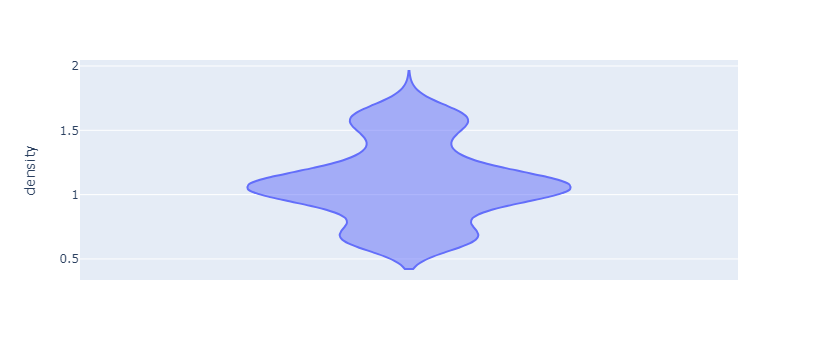

In [15]:
import plotly.express as px
%matplotlib widget

fig = px.violin(data, y="density")
fig.show()

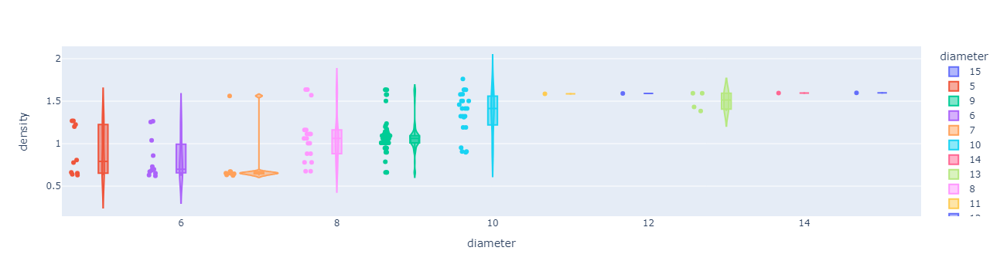

In [28]:
import plotly.express as px

fig = px.violin(data, y="density", x="diameter", color="diameter", box=True, points="all",
          hover_data=data.columns)
fig.show()

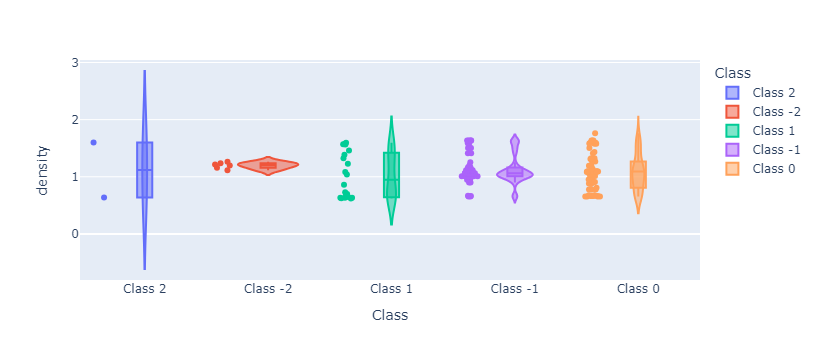

In [57]:
import plotly.express as px

fig = px.violin(data, y="density", x="Class", color="Class", box=True, points="all",
          hover_data=data.columns)
fig.show()

In [18]:
data.duplicated().sum()

22

In [19]:
data.duplicated()

0      False
1      False
2      False
3      False
4      False
       ...  
149     True
150     True
151    False
152    False
153     True
Length: 154, dtype: bool

In [20]:
valeurs = [data[att].values[:5] for att in data.columns]
pd.DataFrame({'Types': data.dtypes, '5 1eres valeurs': valeurs}).transpose()

,SMILES,Class,apol,ASA+,ASA-,a_count,a_donacc,a_heavy,a_hyd,a_IC,...,VSA,vsa_acc,vsa_hyd,vsa_pol,vsurf_A,vsurf_R,vsurf_S,vsurf_V,Weight,zagreb
Types,object,object,float64,float64,float64,int64,int64,float64,int64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64
5 1eres valeurs,[FC(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(...,"[Class 2, Class 2, Class -2, Class -2, Class -2]","[41.283001, 22.934343, 42.919998, 38.509171, 4...","[21.282999, 155.97543, 38.976181, 46.270092, 5...","[622.40619, 156.69504, 499.5217, 421.43369, 48...","[43, 18, 22, 23, 22]","[0, 0, 0, 1, 0]","[43.0, 10.0, 22.0, 19.0, 21.0]","[40, 10, 22, 16, 21]","[49.644451, 17.839369, 21.868664, 38.822643, 2...",...,"[421.45898, 151.37508, 338.42563, 293.98846, 3...","[27.133842, 0.0, 0.0, 2.503756, 0.0]","[357.37701, 130.88504, 345.43402, 263.09042, 3...","[27.133842, 0.0, 0.0, 2.503756, 0.0]","[3.6104541, 0.040119693, 0.048170879, 4.973506...","[7.831074942900001, 0.087019614117, 0.10448263...","[-101.93395060530001, -1.132699292469, -1.3600...","[-4.007604051, -0.04453285923, -0.05346967569,...","[713.09796, 128.174, 498.66199, 423.76498, 464...","[246, 50, 118, 130, 112]"


In [21]:
pd.Categorical(data['Class'].values)

['Class 2', 'Class 2', 'Class -2', 'Class -2', 'Class -2', ..., 'Class -1', 'Class 0', 'Class 0', 'Class 0', 'Class 0']
Length: 154
Categories (5, object): ['Class -1', 'Class -2', 'Class 0', 'Class 1', 'Class 2']

In [22]:
data1 = data.select_dtypes(['int64','float64'])
data1

,apol,ASA+,ASA-,a_count,a_donacc,a_heavy,a_hyd,a_IC,a_nC,a_nCl,...,VSA,vsa_acc,vsa_hyd,vsa_pol,vsurf_A,vsurf_R,vsurf_S,vsurf_V,Weight,zagreb
0,41.283001,21.282999,622.40619,43,0,43.0,40,49.644451,14,0,...,421.45898,27.133842,357.37701,27.133842,3.610454,7.831075,-101.933951,-4.007604,713.09796,246
1,22.934343,155.975430,156.69504,18,0,10.0,10,17.839369,10,0,...,151.37508,0.000000,130.88504,0.000000,0.040120,0.087020,-1.132699,-0.044533,128.17400,50
2,42.919998,38.976181,499.52170,22,0,22.0,22,21.868664,12,10,...,338.42563,0.000000,345.43402,0.000000,0.048171,0.104483,-1.360008,-0.053470,498.66199,118
3,38.509171,46.270092,421.43369,23,1,19.0,16,38.822643,10,8,...,293.98846,2.503756,263.09042,2.503756,4.973507,10.787536,-140.417009,-5.520592,423.76498,130
4,41.406792,56.392834,480.49115,22,0,21.0,21,26.558620,12,9,...,330.35486,0.000000,327.14081,0.000000,0.137724,0.298724,-3.888371,-0.152874,464.21698,112
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,35.353966,108.591640,369.80264,22,0,17.0,17,31.868664,12,5,...,274.55731,0.000000,253.96802,0.000000,0.189245,0.410473,-5.342964,NaN,326.43698,88
150,37.002380,74.775352,427.29446,22,0,19.0,17,34.823284,12,6,...,292.15103,13.566921,256.45273,13.566921,6.924998,15.020321,-195.513477,-7.686748,375.87299,100
151,31.307930,174.869430,178.80505,24,0,14.0,14,23.516850,14,0,...,198.75549,0.000000,166.91910,0.000000,0.098131,0.212847,NaN,-0.108926,178.23399,76
152,33.309174,104.919330,333.65930,21,0,17.0,14,33.219116,12,4,...,248.35408,0.000000,204.05783,0.000000,0.211047,0.457762,NaN,-0.234263,305.97501,96


In [23]:
dataObj = data.select_dtypes(['object'])
dataObj

,SMILES,Class
0,FC(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F...,Class 2
1,c12c(cccc1)cccc2,Class 2
2,Clc1c(Cl)c(Cl)c(c(Cl)c1Cl)-c1c(Cl)c(Cl)c(Cl)c(...,Class -2
3,ClC1(Cl)C2(Cl)C(Cl)=C(Cl)C1(Cl)C1C2C(Cl)C2(Cl)...,Class -2
4,Clc1c(Cl)c(Cl)c(c(Cl)c1Cl)-c1c(Cl)c(Cl)c(Cl)c(...,Class -2
...,...,...
149,Clc1c(Cl)cc(-c2c(Cl)cc(Cl)cc2)cc1Cl,Class -1
150,Clc1c(Cl)c(-c2c(Cl)cc(Cl)c(Cl)c2)cc(Cl)c1[O-],Class 0
151,c12c3c(ccc1cccc2)cccc3,Class 0
152,Clc1c(Cl)cc2c(oc3c2cc(Cl)c(Cl)c3)c1,Class 0


In [42]:
data_cl2 = data[data['Class'] == 'Class 2']
data_cl2 = data_cl2.select_dtypes(['int64','float64'])
data_cl2

,apol,ASA+,ASA-,a_count,a_donacc,a_heavy,a_hyd,a_IC,a_nC,a_nCl,...,VSA,vsa_acc,vsa_hyd,vsa_pol,vsurf_A,vsurf_R,vsurf_S,vsurf_V,Weight,zagreb
0,41.283001,21.282999,622.40619,43,0,43.0,40,49.644451,14,0,...,421.45898,27.133842,357.37701,27.133842,3.610454,7.831075,-101.933951,-4.007604,713.09796,246
1,22.934343,155.975430,156.69504,18,0,10.0,10,17.839369,10,0,...,151.37508,0.000000,130.88504,0.000000,0.040120,0.087020,-1.132699,-0.044533,128.17400,50


In [43]:
data_cl1 = data[data['Class'] == 'Class 1']
data_cl1 = data_cl1.select_dtypes(['int64','float64'])
data_cl1

,apol,ASA+,ASA-,a_count,a_donacc,a_heavy,a_hyd,a_IC,a_nC,a_nCl,...,VSA,vsa_acc,vsa_hyd,vsa_pol,vsurf_A,vsurf_R,vsurf_S,vsurf_V,Weight,zagreb
7,34.401516,194.135090,186.15179,27,0,15.0,15,26.759054,15,0,...,217.29707,0.000000,182.727600,0.000000,0.090570,0.196446,-2.557060,-0.100533,192.26100,82
8,29.121515,209.096600,159.50543,24,0,12.0,12,24.000000,12,0,...,192.69707,0.000000,162.502030,0.000000,0.037095,0.080459,-1.047306,-0.041176,156.22800,62
10,29.294172,56.441948,407.45078,29,0,25.0,21,56.020844,8,0,...,281.21298,48.024784,208.616790,48.024784,5.819246,12.621944,-164.294767,-6.459363,427.15698,136
11,38.409000,20.567190,586.25287,40,0,40.0,37,46.675003,13,0,...,395.16888,27.133842,331.326540,27.133842,3.679348,7.980505,-103.879026,-4.084076,663.09100,228
13,17.148172,106.213120,183.23309,14,0,10.0,7,23.651484,7,0,...,140.10205,27.133842,86.372002,27.133842,4.853486,10.527210,-137.028459,-5.387369,139.10500,46
14,32.215103,218.054780,164.45367,27,0,13.0,13,26.973278,13,0,...,211.31561,0.000000,178.310520,0.000000,0.157661,0.341968,-4.451257,-0.175004,170.25499,68
16,29.354343,162.316210,191.96004,21,0,13.0,13,25.219116,12,0,...,195.09277,0.000000,159.014860,0.000000,0.375149,0.813699,-10.591587,-0.416416,184.26199,72
17,27.787930,169.493290,182.25212,22,0,12.0,12,21.868664,12,0,...,185.48412,0.000000,162.502030,0.000000,0.052312,0.113465,-1.476930,-0.058067,154.21199,58
19,26.027929,182.445890,158.10023,21,0,11.0,11,20.965637,11,0,...,172.08861,0.000000,146.693530,0.000000,0.189442,0.410901,-5.348529,-0.210281,142.20100,56
20,42.464550,131.652310,460.57385,42,2,35.0,28,86.319427,12,0,...,394.03308,59.150364,299.108220,59.150364,2.296451,4.981001,-64.835690,-2.549060,584.22296,192


In [44]:
data_cl0 = data[data['Class'] == 'Class 0']
data_cl0 = data_cl0.select_dtypes(['int64','float64'])
data_cl0

,apol,ASA+,ASA-,a_count,a_donacc,a_heavy,a_hyd,a_IC,a_nC,a_nCl,...,VSA,vsa_acc,vsa_hyd,vsa_pol,vsurf_A,vsurf_R,vsurf_S,vsurf_V,Weight,zagreb
40,39.750725,221.008100,299.27600,29,3,18.0,10,64.788605,9,3,...,315.23523,15.014520,216.527680,15.014520,4.325942,9.382968,-122.134320,-4.801796,350.59000,86
41,39.370964,117.262950,446.34436,39,2,34.0,27,78.980431,11,0,...,374.35284,59.150364,283.299710,59.150364,1.081667,2.346136,-30.538707,-1.200650,570.19598,188
42,52.422001,30.939011,622.90460,23,0,23.0,22,27.803095,12,0,...,432.12012,0.000000,475.687620,0.000000,3.969446,8.609729,-112.069375,-4.406085,959.17096,122
45,22.785137,193.087360,123.51521,20,3,11.0,6,31.909237,8,0,...,162.11577,27.133842,67.651054,32.816418,4.890866,10.608288,-138.083814,-5.428861,151.16499,58
49,46.258652,356.764860,191.02785,40,4,19.0,10,70.864021,12,0,...,338.21643,20.697096,215.875780,20.697096,6.661600,14.449010,-188.076942,-7.394376,304.35098,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147,37.002380,74.775352,427.29446,22,0,19.0,17,34.823284,12,6,...,292.15103,13.566921,256.452730,13.566921,6.924998,15.020321,-195.513477,-7.686748,375.87299,100
150,37.002380,74.775352,427.29446,22,0,19.0,17,34.823284,12,6,...,292.15103,13.566921,256.452730,13.566921,6.924998,15.020321,-195.513477,-7.686748,375.87299,100
151,31.307930,174.869430,178.80505,24,0,14.0,14,23.516850,14,0,...,198.75549,0.000000,166.919100,0.000000,0.098131,0.212847,NaN,-0.108926,178.23399,76
152,33.309174,104.919330,333.65930,21,0,17.0,14,33.219116,12,4,...,248.35408,0.000000,204.057830,0.000000,0.211047,0.457762,NaN,-0.234263,305.97501,96


In [45]:
data_cl_1= data[data['Class'] == 'Class -1']
data_cl_1 = data_cl_1.select_dtypes(['int64','float64'])
data_cl_1

,apol,ASA+,ASA-,a_count,a_donacc,a_heavy,a_hyd,a_IC,a_nC,a_nCl,...,VSA,vsa_acc,vsa_hyd,vsa_pol,vsurf_A,vsurf_R,vsurf_S,vsurf_V,Weight,zagreb
12,36.867172,62.882984,414.99341,22,0,18.0,18,31.578171,12,6,...,282.60461,0.0,272.26123,0.0,0.017169,0.037241,-0.484745,-0.019058,360.88199,94
15,35.353966,78.979683,380.56519,22,0,17.0,17,31.868664,12,5,...,267.47864,0.0,253.96802,0.0,0.127506,0.276560,-3.599871,-0.141531,326.43698,88
18,38.380379,81.089241,429.25940,22,0,19.0,19,30.681574,12,7,...,305.25226,0.0,290.55441,0.0,0.166186,0.360457,-4.691924,-0.184466,395.32700,100
21,36.867172,87.864677,405.67963,22,0,18.0,18,31.578171,12,6,...,290.08371,0.0,272.26123,0.0,0.107276,0.232682,-3.028726,-0.119076,360.88199,94
22,42.087173,64.848389,501.58932,22,0,18.0,18,31.578171,12,0,...,343.72165,0.0,342.91339,0.0,0.083061,0.180160,-2.345071,-0.092198,627.58801,94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142,36.867172,90.308319,405.57889,22,0,18.0,18,31.578171,12,6,...,288.81158,0.0,272.26123,0.0,0.100678,0.218371,-2.842450,-0.111753,360.88199,94
143,36.867172,95.268173,396.99338,22,0,18.0,18,31.578171,12,6,...,288.60156,0.0,272.26123,0.0,0.124300,0.269607,NaN,-0.137973,360.88199,94
144,35.353966,108.591640,369.80264,22,0,17.0,17,31.868664,12,5,...,274.55731,0.0,253.96802,0.0,0.189245,NaN,-5.342964,-0.210062,326.43698,88
148,33.840759,95.076378,343.77106,22,0,16.0,16,31.578171,12,4,...,251.57268,0.0,235.67482,0.0,0.319361,NaN,NaN,NaN,291.99200,82


In [46]:
data_cl_2 = data[data['Class'] == 'Class -2']
data_cl_2 = data_cl_2.select_dtypes(['int64','float64'])
data_cl_2

,apol,ASA+,ASA-,a_count,a_donacc,a_heavy,a_hyd,a_IC,a_nC,a_nCl,...,VSA,vsa_acc,vsa_hyd,vsa_pol,vsurf_A,vsurf_R,vsurf_S,vsurf_V,Weight,zagreb
2,42.919998,38.976181,499.52170,22,0,22.0,22,21.868664,12,10,...,338.42563,0.000000,345.43402,0.000000,0.048171,0.104483,-1.360008,-0.053470,498.66199,118
3,38.509171,46.270092,421.43369,23,1,19.0,16,38.822643,10,8,...,293.98846,2.503756,263.09042,2.503756,4.973507,10.787536,-140.417009,-5.520592,423.76498,130
4,41.406792,56.392834,480.49115,22,0,21.0,21,26.558620,12,9,...,330.35486,0.000000,327.14081,0.000000,0.137724,0.298724,-3.888371,-0.152874,464.21698,112
5,40.164001,87.264442,444.83752,22,0,22.0,20,29.087946,12,8,...,320.80972,0.000000,306.64761,0.000000,0.083862,0.181897,-2.367678,-0.093087,459.75400,124
6,39.893585,71.585495,458.19672,22,0,20.0,20,29.087946,12,8,...,316.52261,0.000000,308.84763,0.000000,0.151460,0.328517,-4.276168,-0.168121,429.77200,106
9,38.380379,84.536034,430.07404,22,0,19.0,19,30.681574,12,7,...,303.78513,0.000000,290.55441,0.000000,0.110285,0.239208,-3.113668,-0.122416,395.32700,100


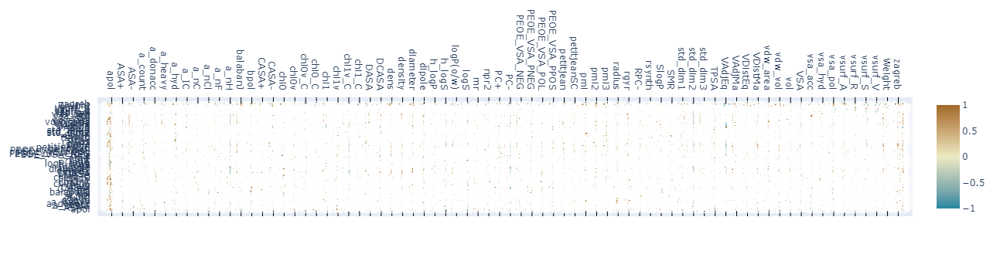

In [24]:
import plotly.figure_factory as ff

corrs = data1.corr()

figure = ff.create_annotated_heatmap(
    z=corrs.values,
    x=list(corrs.columns),
    y=list(corrs.index),
    colorscale='Earth',
    annotation_text=corrs.round(2).values,
    showscale=True, reversescale=True)

figure.show()

In [51]:
corrs


,apol,ASA+,ASA-,a_count,a_donacc,a_heavy,a_hyd,a_IC,a_nC,a_nCl,...,VSA,vsa_acc,vsa_hyd,vsa_pol,vsurf_A,vsurf_R,vsurf_S,vsurf_V,Weight,zagreb
apol,1.000000,-0.502619,0.972198,-0.479825,-0.479825,0.838435,0.849384,-0.867877,0.479825,0.940099,...,0.959256,-0.479825,0.935422,-0.479825,-0.487870,-0.487870,0.487870,0.487870,0.947130,0.091246
ASA+,-0.502619,1.000000,-0.477542,-0.436437,-0.436437,-0.104305,-0.033391,0.106688,0.436437,-0.756851,...,-0.251728,-0.436437,-0.232735,-0.436437,-0.430762,-0.430762,0.430762,0.430762,-0.521282,-0.430176
ASA-,0.972198,-0.477542,1.000000,-0.561155,-0.561155,0.728337,0.889333,-0.902130,0.561155,0.891402,...,0.954296,-0.561155,0.961570,-0.561155,-0.566141,-0.566141,0.566141,0.566141,0.849494,-0.114602
a_count,-0.479825,-0.436437,-0.561155,1.000000,1.000000,-0.533114,-0.869626,0.832290,-1.000000,-0.158114,...,-0.693976,1.000000,-0.751781,1.000000,0.999825,0.999825,-0.999825,-0.999825,-0.289337,0.654654
a_donacc,-0.479825,-0.436437,-0.561155,1.000000,1.000000,-0.533114,-0.869626,0.832290,-1.000000,-0.158114,...,-0.693976,1.000000,-0.751781,1.000000,0.999825,0.999825,-0.999825,-0.999825,-0.289337,0.654654
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
vsurf_R,-0.487870,-0.430762,-0.566141,0.999825,0.999825,-0.542781,-0.873801,0.838399,-0.999825,-0.166741,...,-0.699877,0.999825,-0.757196,0.999825,1.000000,1.000000,-1.000000,-1.000000,-0.299611,0.646140
vsurf_S,0.487870,0.430762,0.566141,-0.999825,-0.999825,0.542781,0.873801,-0.838399,0.999825,0.166741,...,0.699877,-0.999825,0.757196,-0.999825,-1.000000,-1.000000,1.000000,1.000000,0.299611,-0.646140
vsurf_V,0.487870,0.430762,0.566141,-0.999825,-0.999825,0.542781,0.873801,-0.838399,0.999825,0.166741,...,0.699877,-0.999825,0.757196,-0.999825,-1.000000,-1.000000,1.000000,1.000000,0.299611,-0.646140
Weight,0.947130,-0.521282,0.849494,-0.289337,-0.289337,0.902267,0.696441,-0.712298,0.289337,0.935400,...,0.872941,-0.289337,0.801257,-0.289337,-0.299611,-0.299611,0.299611,0.299611,1.000000,0.391713


<Axes: >

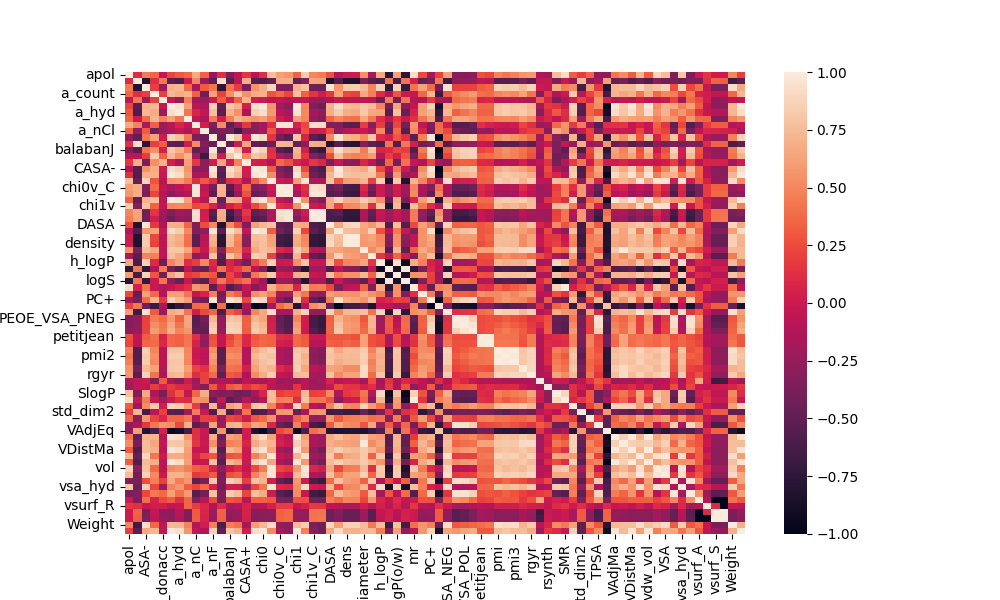

In [54]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10,6))
sns.heatmap(data1.corr())

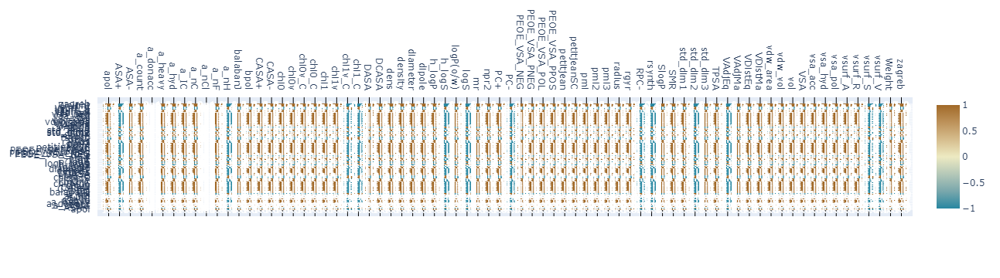

In [41]:
import plotly.figure_factory as ff

corrs = data_cl2.corr()

figure = ff.create_annotated_heatmap(
    z=corrs.values,
    x=list(corrs.columns),
    y=list(corrs.index),
    colorscale='Earth',
    annotation_text=corrs.round(2).values,
    showscale=True, reversescale=True)

figure.show()

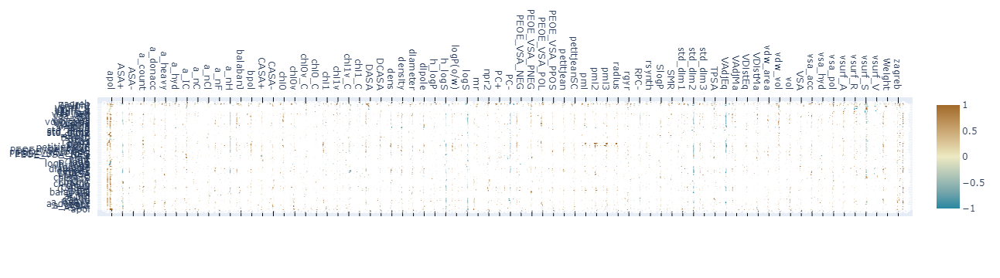

In [47]:
import plotly.figure_factory as ff

corrs = data_cl1.corr()

figure = ff.create_annotated_heatmap(
    z=corrs.values,
    x=list(corrs.columns),
    y=list(corrs.index),
    colorscale='Earth',
    annotation_text=corrs.round(2).values,
    showscale=True, reversescale=True)

figure.show()

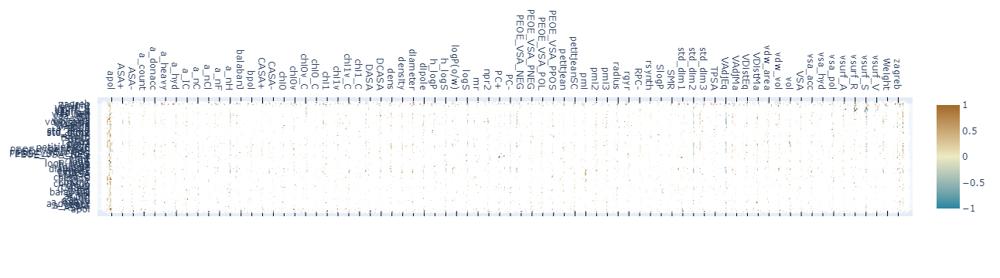

In [48]:
import plotly.figure_factory as ff

corrs = data_cl0.corr()

figure = ff.create_annotated_heatmap(
    z=corrs.values,
    x=list(corrs.columns),
    y=list(corrs.index),
    colorscale='Earth',
    annotation_text=corrs.round(2).values,
    showscale=True, reversescale=True)

figure.show()

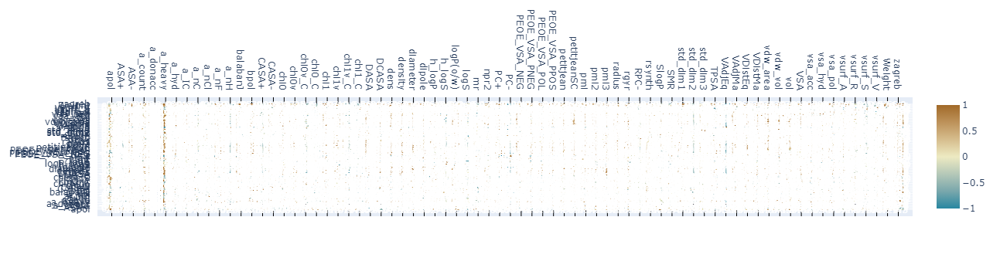

In [49]:
import plotly.figure_factory as ff

corrs = data_cl_1.corr()

figure = ff.create_annotated_heatmap(
    z=corrs.values,
    x=list(corrs.columns),
    y=list(corrs.index),
    colorscale='Earth',
    annotation_text=corrs.round(2).values,
    showscale=True, reversescale=True)

figure.show()

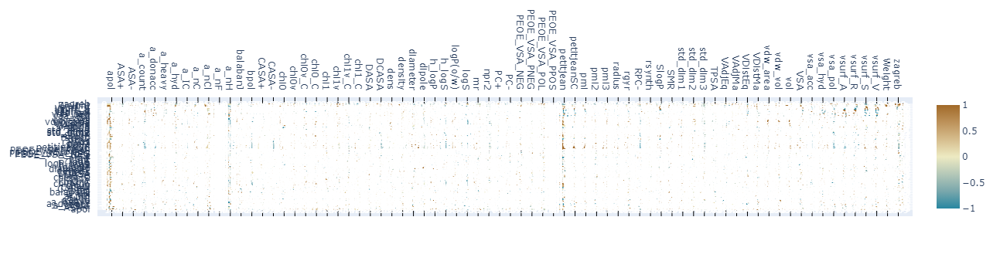

In [50]:
import plotly.figure_factory as ff

corrs = data_cl_2.corr()

figure = ff.create_annotated_heatmap(
    z=corrs.values,
    x=list(corrs.columns),
    y=list(corrs.index),
    colorscale='Earth',
    annotation_text=corrs.round(2).values,
    showscale=True, reversescale=True)

figure.show()

In [25]:
corrs

,apol,ASA+,ASA-,a_count,a_donacc,a_heavy,a_hyd,a_IC,a_nC,a_nCl,...,VSA,vsa_acc,vsa_hyd,vsa_pol,vsurf_A,vsurf_R,vsurf_S,vsurf_V,Weight,zagreb
apol,1.000000,0.093854,0.441932,0.354309,-0.056454,0.224686,0.302549,0.356290,0.668823,0.340352,...,0.754929,-0.353525,0.798512,-0.381534,-0.006324,0.159149,0.002000,-0.001928,0.489777,0.194209
ASA+,0.093854,1.000000,-0.806889,0.122243,0.434216,-0.539307,-0.588519,-0.005241,0.490787,-0.243623,...,-0.418989,-0.371462,-0.438338,-0.338982,-0.355846,0.127301,0.336599,0.323987,-0.649781,-0.531238
ASA-,0.441932,-0.806889,1.000000,0.194426,-0.249300,0.696374,0.730430,0.374590,-0.167387,0.308205,...,0.866011,0.259640,0.845631,0.230439,0.392354,-0.030509,-0.368328,-0.365926,0.921626,0.651780
a_count,0.354309,0.122243,0.194426,1.000000,0.210631,0.741470,0.664512,0.712306,0.333264,-0.416461,...,0.501382,0.463793,0.230728,0.434680,0.062214,0.018003,-0.050133,-0.055566,0.364161,0.730912
a_donacc,-0.056454,0.434216,-0.249300,0.210631,1.000000,-0.038607,-0.264848,0.473747,-0.209087,-0.223064,...,-0.015136,0.215365,-0.219343,0.367679,0.236049,0.027932,-0.274853,-0.252158,-0.073919,-0.059004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
vsurf_R,0.159149,0.127301,-0.030509,0.018003,0.027932,-0.059081,-0.025680,0.349069,0.189517,0.084933,...,0.050220,-0.219963,0.084919,-0.208827,-0.103277,1.000000,0.108450,-1.000000,-0.024122,-0.063659
vsurf_S,0.002000,0.336599,-0.368328,-0.050133,-0.274853,-0.275309,-0.096527,-0.346012,0.311058,0.075438,...,-0.275779,-0.470713,-0.101008,-0.521165,-1.000000,0.108450,1.000000,1.000000,-0.379804,-0.257903
vsurf_V,-0.001928,0.323987,-0.365926,-0.055566,-0.252158,-0.284098,-0.110645,-0.343499,0.319203,0.060615,...,-0.283980,-0.473223,-0.113886,-0.514820,-1.000000,-1.000000,1.000000,1.000000,-0.379672,-0.266480
Weight,0.489777,-0.649781,0.921626,0.364161,-0.073919,0.734251,0.724385,0.486315,-0.123519,0.020116,...,0.902810,0.317203,0.837065,0.303139,0.401157,-0.024122,-0.379804,-0.379672,1.000000,0.694596
